# Imports

In [1]:
import pandas as pd
import sys, os, importlib
from datetime import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go

In [2]:
pd.set_option('display.max_rows', 100)

if os.path.join('..','0_funcoes_base') not in sys.path:
    sys.path.append(os.path.join('..','0_funcoes_base')) 

df_manipulator = importlib.import_module('df_manipulator')
plot_manipulator = importlib.import_module('plot_manipulator')
file_manipulator = importlib.import_module('file_manipulator')


# Dados de configuração

In [3]:
input_config = {
    'file': {
        'ref_dir':'../1_pre_processamento/out/',
        'filename':'4_export_lunar_20200517_20200620.csv',
        'delimiter': ';'
    },
    'regions':[0,1]
}

output_config = {
    'file': {
        'ref_dir': './out',
        'prefix':'0_'
    },
    'mapping_window_width': (5000, 3000),
    'mapping_window_freq': 'milliseconds',
    'save_figures': False
}

# Funções

In [4]:
def get_speed_bump_window_distribution(df, mapping_window_width, mapping_window_freq, speed_bump_id, verbose=False):
    _df = df.copy()

    sb_indexes = df_manipulator.get_speed_bumps_idx(_df, speed_bump_id)

    mapping_speed_bump_timestamps = df_manipulator.get_affected_timestamps_by_speed_bumps(_df, sb_indexes, mapping_window_width=mapping_window_width, mapping_window_freq=mapping_window_freq, verbose=verbose)

    return mapping_speed_bump_timestamps

def plot_speed_bump_distribution(df, mapping_speed_bump_timestamps, speed_bump_id, columns, limit=-1, backward_time=20, forward_time=5, save_figure=False):
    count_plots = 0
    save_figure_name = None

    if speed_bump_id not in mapping_speed_bump_timestamps:
        return

    previous_base_date = list(mapping_speed_bump_timestamps[speed_bump_id].keys())[0] - pd.Timedelta(minutes=30)

    for base_date in list(mapping_speed_bump_timestamps[speed_bump_id].keys()):
        elapsed_time = base_date - previous_base_date
        
        if elapsed_time.seconds < 3:
            continue

        start_date = (base_date - pd.Timedelta(seconds=backward_time)).strftime('%d/%m/%Y %H:%M:%S.%f')
        end_date   = (base_date + pd.Timedelta(seconds=forward_time)).strftime('%d/%m/%Y %H:%M:%S.%f')

        special_points = {}
        
        special_points[previous_base_date.strftime('%d/%m/%Y %H:%M:%S.%f')] = 'Quebra-mola'
        special_points[(previous_base_date - pd.Timedelta(milliseconds=output_config['mapping_window_width'][0])).strftime('%d/%m/%Y %H:%M:%S.%f')] = 'Início'
        special_points[(previous_base_date + pd.Timedelta(milliseconds=output_config['mapping_window_width'][1])).strftime('%d/%m/%Y %H:%M:%S.%f')] = 'Fim'

        special_points[base_date.strftime('%d/%m/%Y %H:%M:%S.%f')] = 'Quebra-mola'
        special_points[(base_date - pd.Timedelta(milliseconds=output_config['mapping_window_width'][0])).strftime('%d/%m/%Y %H:%M:%S.%f')] = 'Início do efeito'
        special_points[(base_date + pd.Timedelta(milliseconds=output_config['mapping_window_width'][1])).strftime('%d/%m/%Y %H:%M:%S.%f')] = 'Fim do efeito'

        if save_figure:
            formatted_start_date = (base_date - pd.Timedelta(seconds=backward_time)).strftime('%Y%m%d-%H%M%S')
            formatted_end_date   = (base_date + pd.Timedelta(seconds=forward_time)).strftime('%Y%m%d-%H%M%S')

            save_figure_name = output_config['file']['prefix'] + 's' + str(speed_bump_id) + '_' + formatted_start_date + '_' + formatted_end_date + '.png'
            save_figure_name = os.path.join(output_config['file']['ref_dir'],save_figure_name)
            #plt.savefig(os.path.join(output_config['file']['ref_dir'],save_figure_name), quality=100)

        print(f"\nQuebra-mola às {base_date.strftime('%d/%m/%Y %H:%M:%S.%f')}")

        plot_manipulator.plot_timeseries(df, columns, start_date, end_date, legend=columns, special_dates=special_points, save_figure_name=save_figure_name)
                
        count_plots +=1

        previous_base_date = base_date

        if limit > 1 and count_plots >= limit:
            break

def distplot(df, tags, region_id, nrows=None, ncols=None, size=None, row_height=4, save_figure=None):
    _df = df.copy()

    _df = _df[_df.region_id == region_id]

    ncols = ncols if ncols else 2
    nrows = nrows if nrows else int(np.ceil(len(tags)/ncols))    
    
    size = size if size else (15,nrows*row_height)
    fig, axs = plt.subplots(nrows=nrows, ncols = ncols, figsize = size)
    
    #print(f'\nGráficos de distribuição na Região {region_id}')
   
    for i, tag in enumerate(tags):
        row = i//ncols
        col = i%ncols
        df_plt = _df[tag]
        df_plt.dropna(inplace=True)
        sns.distplot(df_plt, hist=True, rug=False, norm_hist=False, axlabel=None, label=None, ax=axs[row,col], color=None)

    if save_figure:
        figure_name = os.path.join(output_config['file']['ref_dir'], output_config['file']['prefix'] + 'dist_r' + str(region_id) + '_' + file_manipulator.remove_prefix(input_config['file']['filename']).replace('.csv', '.png'))
        print(figure_name)
        plt.savefig(figure_name, quality=100)

def distplot2(df, tags, nrows=None, ncols=None, size=None, row_height=4, save_figure=None):
    _df = df.copy()

    ncols = ncols if ncols else 2
    nrows = nrows if nrows else int(np.ceil(len(tags)/ncols))    
    
    size = size if size else (15,nrows*row_height)
    
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=size)

    k = 0
    for i in range(nrows):
        for j in range(ncols):
            sns.distplot(_df[_df['region_id']==0][tags[k]].dropna(), hist=False, kde=True, label='Região 0',ax=axes[i, j])
            sns.distplot(_df[_df['region_id']==1][tags[k]].dropna(), hist=False, kde=True, label='Região 1',ax=axes[i, j])
            k = k + 1

    if save_figure:
        figure_name = os.path.join(output_config['file']['ref_dir'], output_config['file']['prefix'] + 'dist_' + file_manipulator.remove_prefix(input_config['file']['filename']).replace('.csv', '.png'))
        print(figure_name)
        plt.savefig(figure_name, quality=100)


def scatter_hist(x, y):
    left, width = 0.1, 0.65
    bottom, height = 0.1, 0.65
    spacing = 0.005

    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom + height + spacing, width, 0.2]
    rect_histy = [left + width + spacing, bottom, 0.2, height]

    fig = plt.figure(figsize=(8, 8))

    ax = fig.add_axes(rect_scatter)
    ax_histx = fig.add_axes(rect_histx, sharex=ax)
    ax_histy = fig.add_axes(rect_histy, sharey=ax)

    # no labels
    ax_histx.tick_params(axis="x", labelbottom=False)
    ax_histy.tick_params(axis="y", labelleft=False)

    # the scatter plot:
    ax.scatter(x, y, color='b')

    # now determine nice limits by hand:
    binwidth = 0.25
    xymax = max(np.max(np.abs(x)), np.max(np.abs(y)))
    lim = (int(xymax/binwidth) + 1) * binwidth

    bins = np.arange(-lim, lim + binwidth, binwidth)
    ax_histx.hist(x, bins=bins, color='skyblue')
    ax_histy.hist(y, bins=bins, color='green',orientation='horizontal')

    plt.show()


def corr_matrix_plot(df, region_id, title, columns=None, annotation=True, font_size=18, save_figure=None):
    plt.rcParams["figure.figsize"] = (50,17)

    dist_columns = ['y','z','z-norm', 'z-diff_5', 'z-diff_10', 'z-diff_20', 'z-diff_30', 'z-diff_40', 'z-diff_50', 'z-mean_5', 'z-mean_10', 'z-mean_20', 'z-mean_30', 'z-mean_40', 'z-mean_50', 'z-norm', 'z-std_5', 'z-std_10', 'z-std_20', 'z-std_30', 'z-std_40', 'z-std_50']

    if not columns:
        columns = dist_columns + ['z-corr-std_5', 'y-corr-z-mean_5', 'cp']
    
    corr = df[df.region_id == input_config['regions'][region_id]][columns].corr()

    ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=annotation
    )
    ax.set_xticklabels(
        ax.get_xticklabels(),
        rotation=45,
        horizontalalignment='right'
    )

    ax.set_title(title, fontsize=font_size)

    if save_figure:
        figure_name = os.path.join(output_config['file']['ref_dir'], output_config['file']['prefix'] + 'corr_matrix' + '_r' + str(region_id) + '_' + file_manipulator.remove_prefix(input_config['file']['filename']).replace('.csv', '.png'))
        plt.savefig(figure_name, quality=100)

    plt.show()


def count_plot(df, column, title, palette=["#7159C1", "#DF0101"], save_figure=None):
    plt.figure(figsize=(12,6))
    sns.countplot(column, data=df, hue=df[column], palette=palette)
    plt.title(title, fontsize=18)

    if save_figure:
        figure_name = os.path.join(output_config['file']['ref_dir'], output_config['file']['prefix'] + 'count_plot_' + str(column) + '_' + file_manipulator.remove_prefix(input_config['file']['filename']).replace('.csv', '.png'))
        plt.savefig(figure_name, quality=100)


def box_plot(df, column_1, column_2, title, linewidth=2.0, palette="Set2"):
    plt.figure(figsize=(12,6))
    sns.boxplot(x=df[column_1], y=df[column_2], linewidth=linewidth, palette=palette)
    plt.title(title, fontsize=18)


# Carrega dataframe

In [5]:
df = df_manipulator.load_dataframes(input_config['file']['filename'], input_config['file']['ref_dir'], input_config['file']['delimiter'])
df.timestamp = pd.to_datetime(df.timestamp)
df_manipulator.set_index(df, 'timestamp', True)

df

,speed_bump_id,y,z,lat,lng,region_id,z-norm,y-norm,z-diff_5,z-mean_5,...,z-std_40,z-diff_50,z-mean_50,z-std_50,cp,cm,cp-norm,cm-norm,region_1_distance,region_1_counter
timestamp,,,,,,,,,,,,,,,,,,,,,
2020-05-17 20:14:37.800,0,8.869766,3.867615,-22.918661,-42.474443,0,0.556034,-0.582893,-0.008656,0.113420,...,0.336686,0.092271,0.050878,0.320713,0.112067,0.0,-0.532930,-0.589459,50,0
2020-05-17 20:14:37.900,0,9.305511,2.878815,-22.918661,-42.474443,0,-0.039402,-0.026477,0.080740,0.129568,...,0.337142,-0.138407,0.048110,0.320886,0.000000,0.0,-0.541349,-0.589459,51,0
2020-05-17 20:14:38.000,0,9.662247,3.400757,-22.918661,-42.474443,0,0.274901,0.429049,0.487314,0.227030,...,0.338553,0.713665,0.062383,0.314598,0.000000,0.0,-0.541349,-0.589459,52,0
2020-05-17 20:14:38.100,0,9.662247,3.400757,-22.918661,-42.474443,0,0.274901,0.429049,0.487314,0.324493,...,0.339917,0.546424,0.073312,0.312244,0.000000,0.0,-0.541349,-0.589459,53,0
2020-05-17 20:14:38.200,0,9.300720,2.878815,-22.918661,-42.474443,0,-0.039402,-0.032595,-0.595436,0.205406,...,0.310102,0.232121,0.077954,0.308718,0.000000,0.0,-0.541349,-0.589459,54,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-20 14:41:23.800,0,8.189819,6.620956,-22.871247,-42.340474,0,2.214042,-1.451139,-0.441170,2.394546,...,1.293164,2.985854,0.119045,1.250509,16.928566,0.0,0.730303,-0.589459,69,0
2020-06-20 14:41:23.900,0,8.189819,6.620956,-22.871247,-42.340474,0,2.214042,-1.451139,-0.087944,2.376957,...,1.316100,2.747963,0.174004,1.281234,18.642608,0.0,0.859060,-0.589459,70,0
2020-06-20 14:41:24.000,0,8.970322,5.715942,-22.871481,-42.340609,0,1.669060,-0.454491,-0.632925,2.250372,...,1.330288,2.401941,0.222043,1.291525,19.811669,0.0,0.946878,-0.589459,71,0


In [6]:
df.speed_bump_id.value_counts()

0    20478
1       84
Name: speed_bump_id, dtype: int64

# Distribuição dos quebra-molas e regiões no dataset

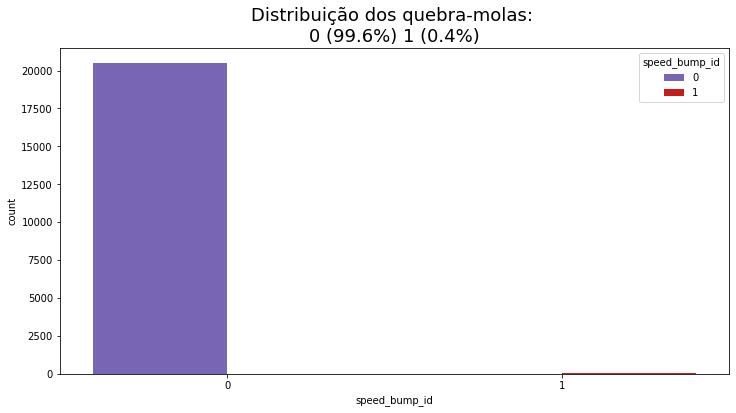

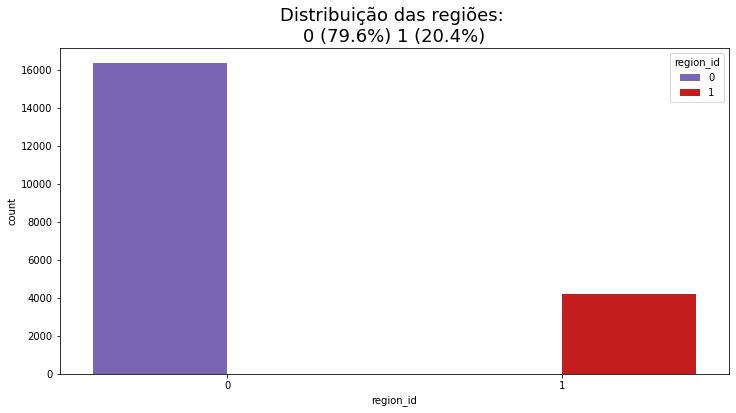

In [7]:
title = 'Distribuição dos quebra-molas: \n' + str(0) + ' (' + str(round(df['speed_bump_id'].value_counts()[0]/len(df) * 100,1)) + '%' + ') ' + str(1) + ' (' + str(round(df['speed_bump_id'].value_counts()[1]/len(df) * 100,1)) + '%' + ')'

count_plot(df, 'speed_bump_id', title, palette=["#7159C1", "#DF0101"], save_figure=output_config['save_figures'])

title = 'Distribuição das regiões: \n' + str(0) + ' (' + str(round(df['region_id'].value_counts()[0]/len(df) * 100,1)) + '%' + ') ' + str(1) + ' (' + str(round(df['region_id'].value_counts()[1]/len(df) * 100,1)) + '%' + ')'

count_plot(df, 'region_id', title, palette=["#7159C1", "#DF0101"], save_figure=output_config['save_figures'])

# Boxplot do eixo Z e Y nas diferentes regiões

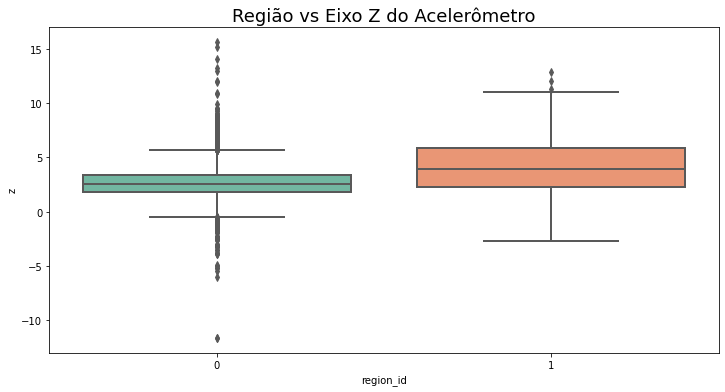

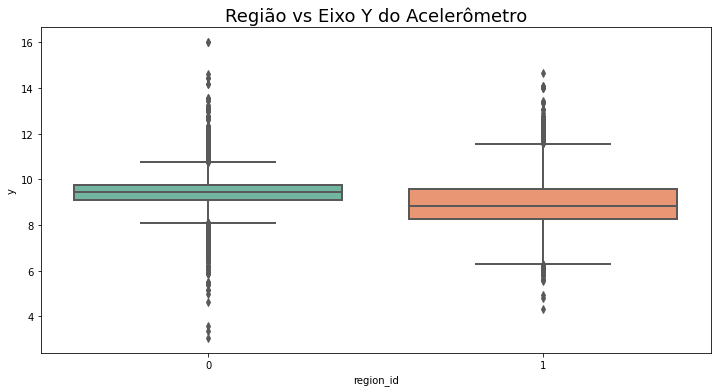

In [8]:
box_plot(df, 'region_id', 'z', title='Região vs Eixo Z do Acelerômetro')
box_plot(df, 'region_id', 'y', title='Região vs Eixo Y do Acelerômetro')


# Boxplot do eixo Z e Y quanto passa ou não por um quebra-mola

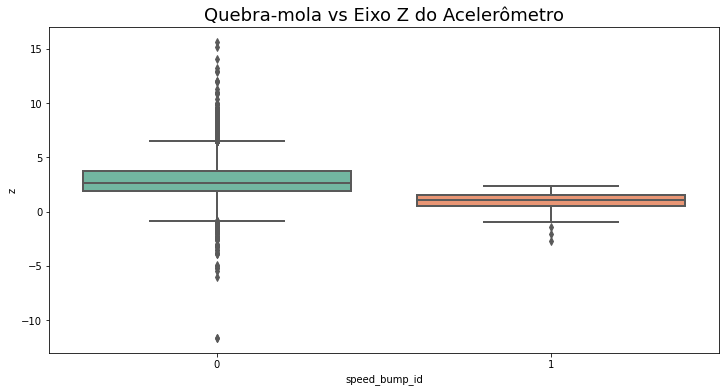

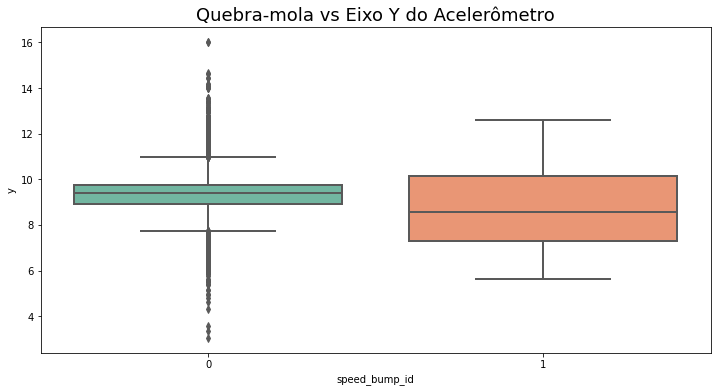

In [9]:
box_plot(df, 'speed_bump_id', 'z', title='Quebra-mola vs Eixo Z do Acelerômetro')
box_plot(df, 'speed_bump_id', 'y', title='Quebra-mola vs Eixo Y do Acelerômetro')

Text(0.5, 0.98, 'Quebra-mola vs Eixo Y do Acelerômetro')

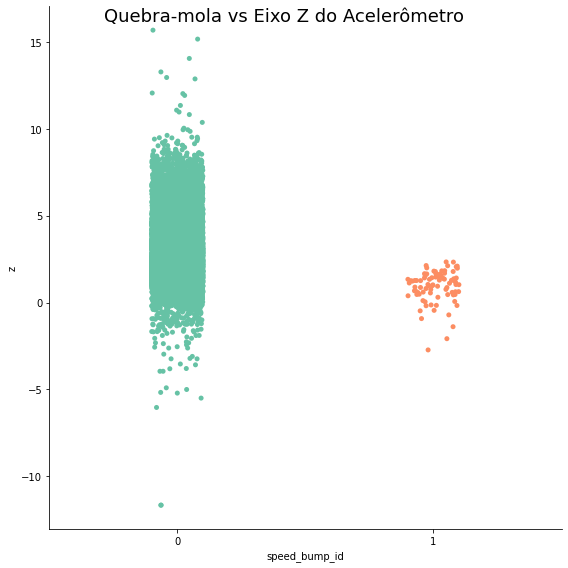

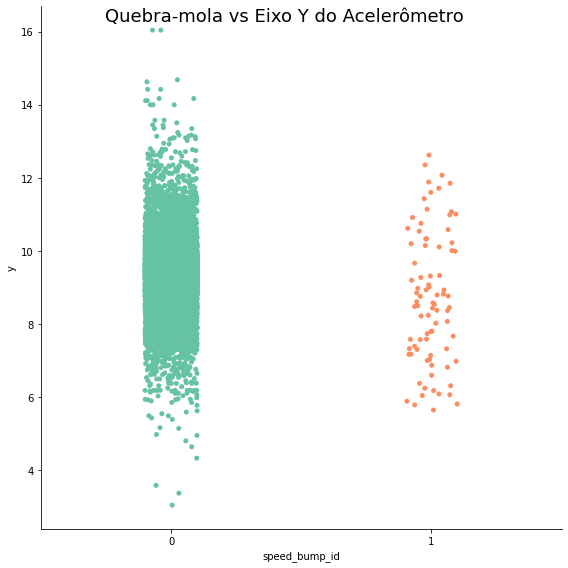

In [10]:
sns.catplot(x='speed_bump_id', y='z', data=df, hue='speed_bump_id', height=8, legend_out=False, palette='Set2').fig.suptitle("Quebra-mola vs Eixo Z do Acelerômetro", fontsize=18)
sns.catplot(x='speed_bump_id', y='y', data=df, hue='speed_bump_id', height=8, legend_out=False, palette="Set2").fig.suptitle("Quebra-mola vs Eixo Y do Acelerômetro", fontsize=18)

# Plot do comportamento dos dados próximos aos eventos de quebra-molas

In [11]:
mapping_speed_bump_timestamps = get_speed_bump_window_distribution(df, mapping_window_width=output_config['mapping_window_width'], mapping_window_freq=output_config['mapping_window_freq'], speed_bump_id=1)


Quebra-mola às 17/05/2020 20:14:54.300000
Shape: (149, 36)


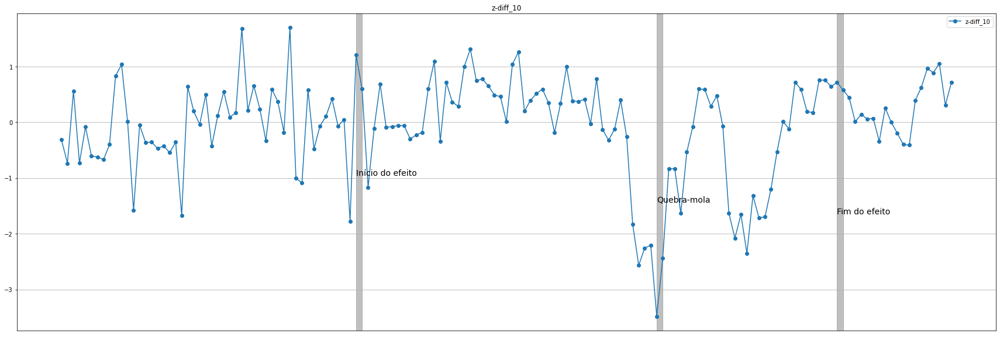


Quebra-mola às 17/05/2020 20:15:03.100000
Shape: (149, 36)


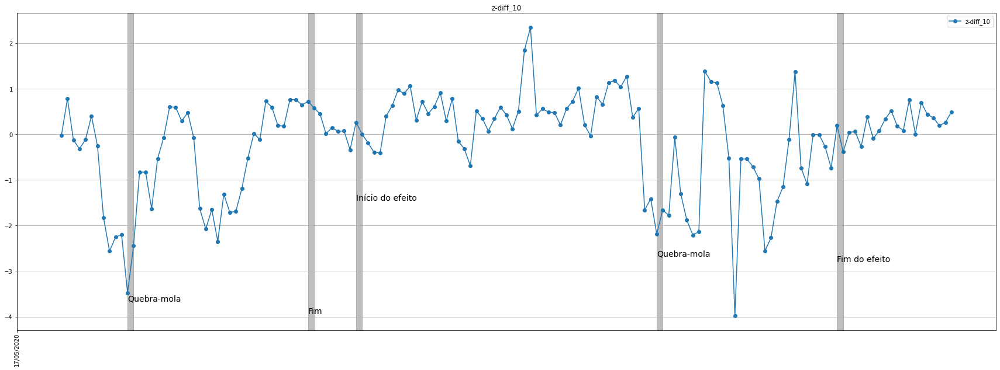


Quebra-mola às 17/05/2020 20:15:40.100000
Shape: (149, 36)


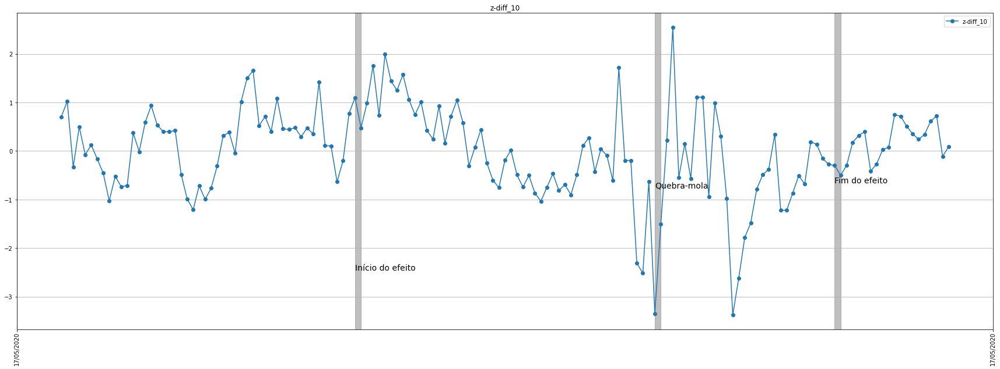


Quebra-mola às 17/05/2020 20:16:05.600000
Shape: (149, 36)


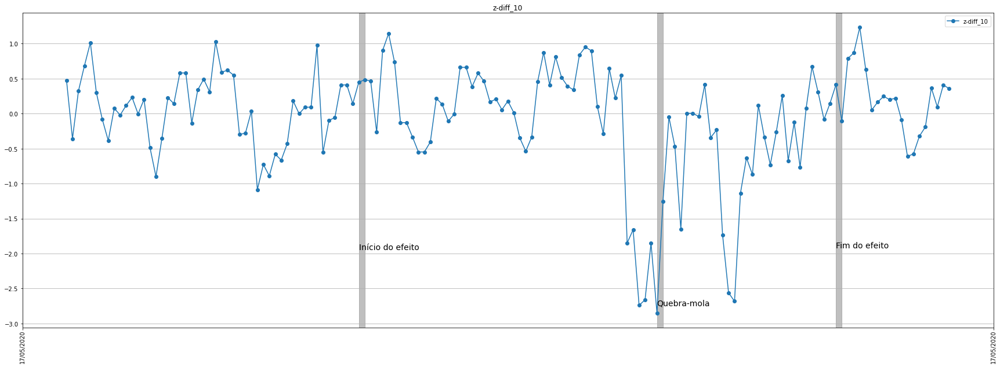


Quebra-mola às 17/05/2020 20:16:29.000000
Shape: (149, 36)


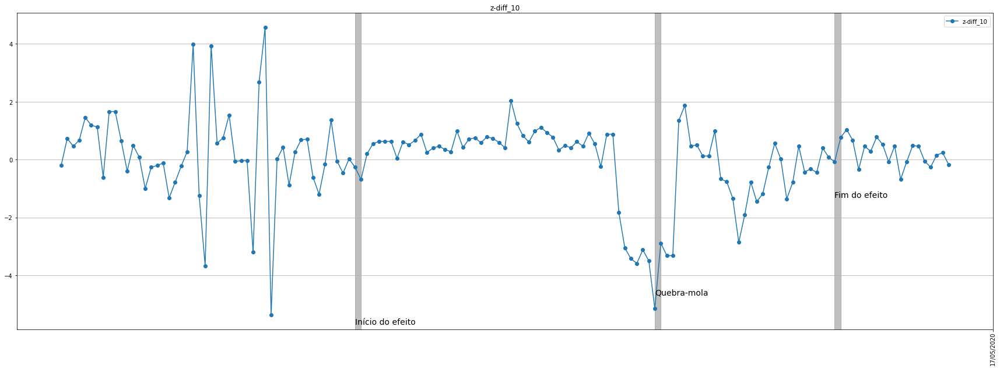


Quebra-mola às 17/05/2020 20:16:48.700000
Shape: (149, 36)


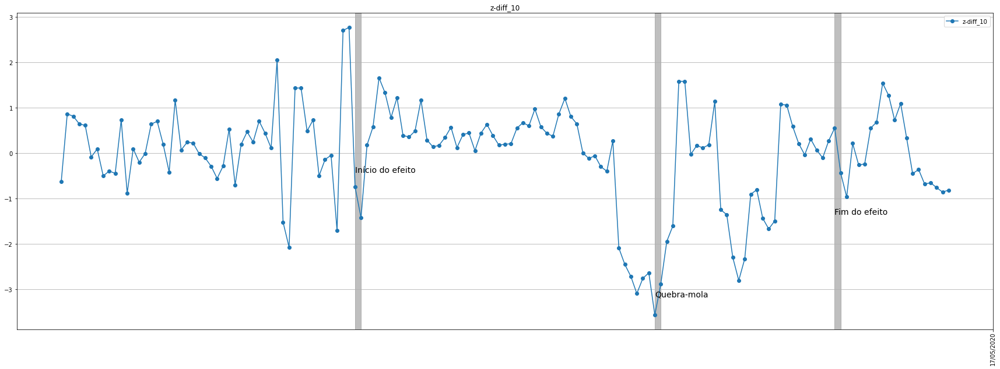


Quebra-mola às 17/05/2020 20:17:04.100000
Shape: (149, 36)


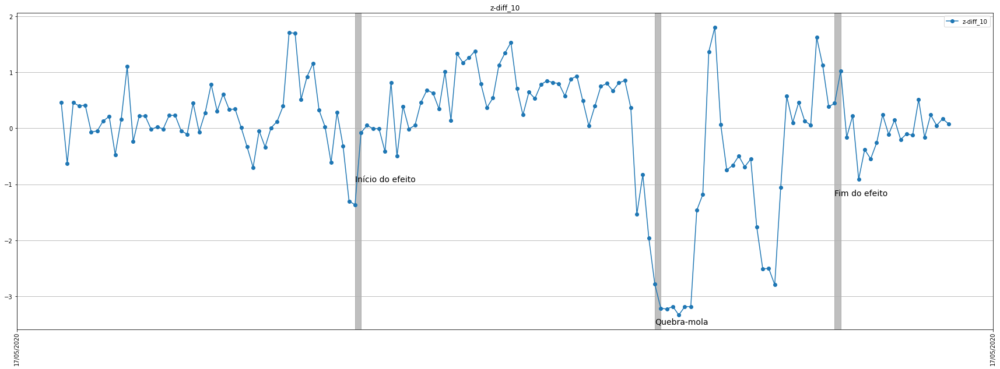


Quebra-mola às 17/05/2020 20:17:27.800000
Shape: (149, 36)


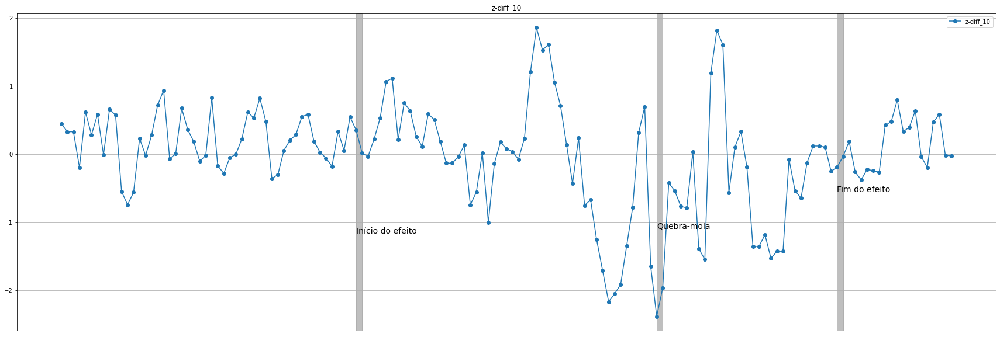


Quebra-mola às 17/05/2020 20:17:58.200000
Shape: (149, 36)


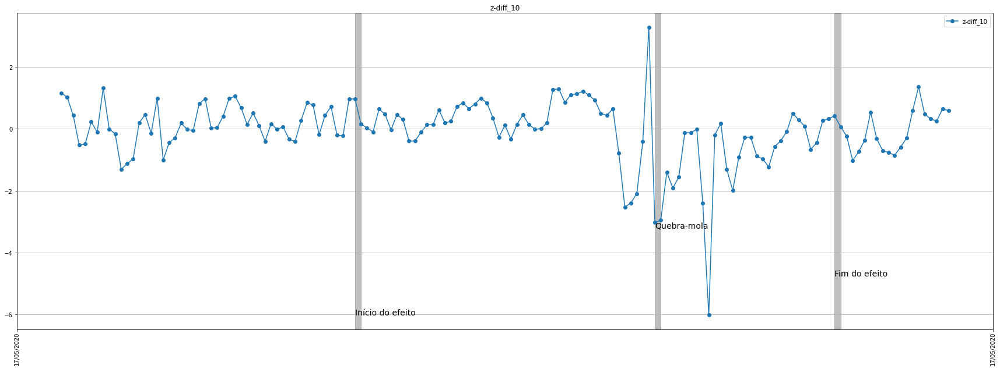


Quebra-mola às 17/05/2020 20:18:45.200000
Shape: (149, 36)


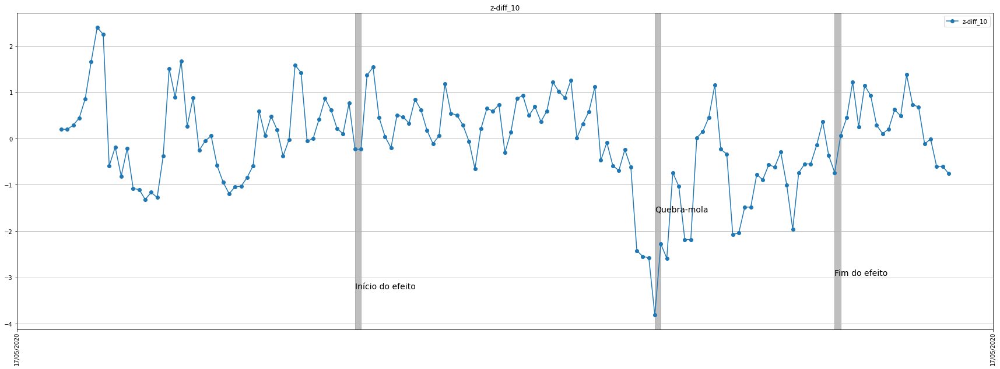


Quebra-mola às 17/05/2020 20:22:30.300000
Shape: (119, 36)


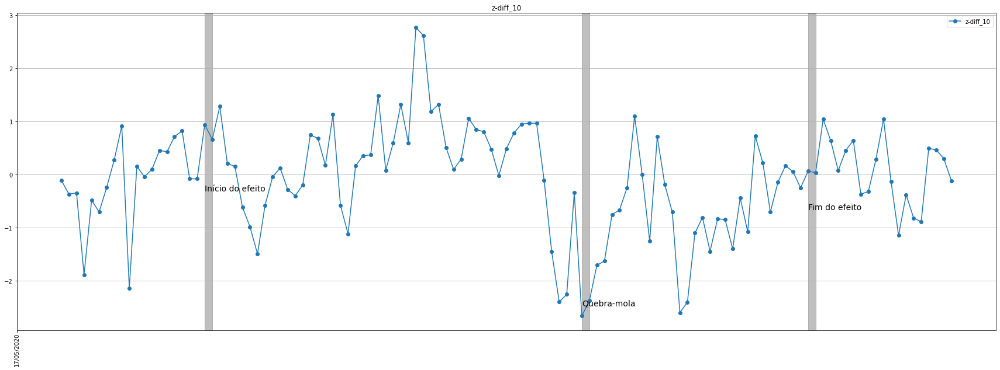


Quebra-mola às 17/05/2020 20:23:17.300000
Shape: (149, 36)


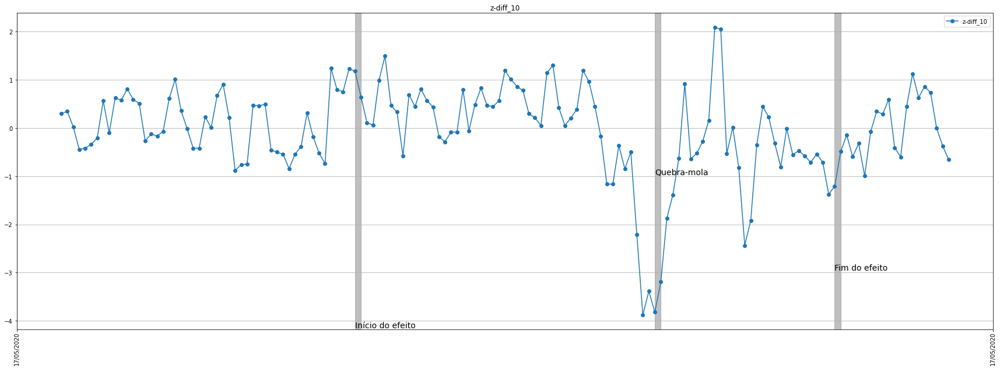


Quebra-mola às 17/05/2020 20:23:46.500000
Shape: (149, 36)


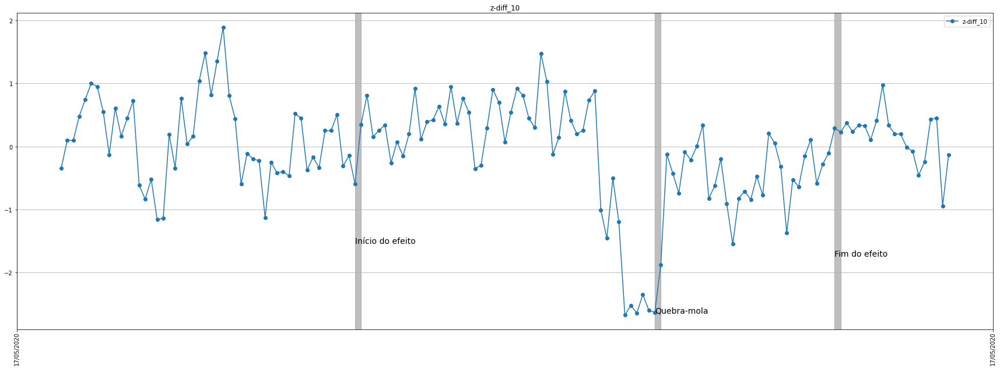


Quebra-mola às 17/05/2020 20:24:24.100000
Shape: (149, 36)


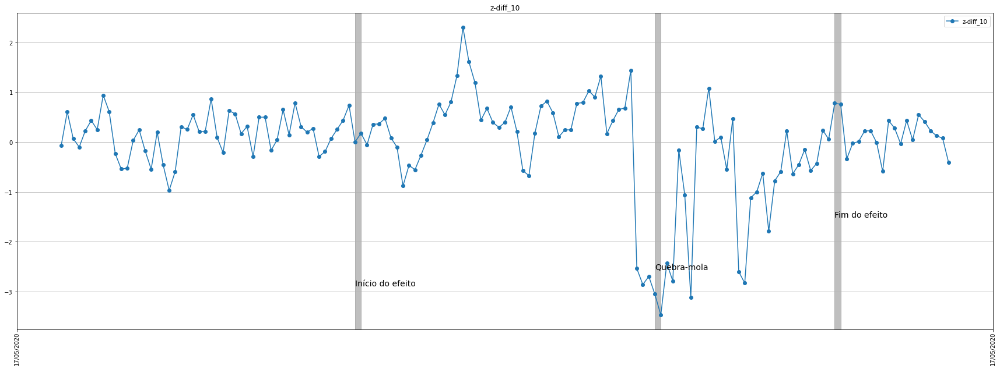


Quebra-mola às 17/05/2020 20:25:07.100000
Shape: (149, 36)


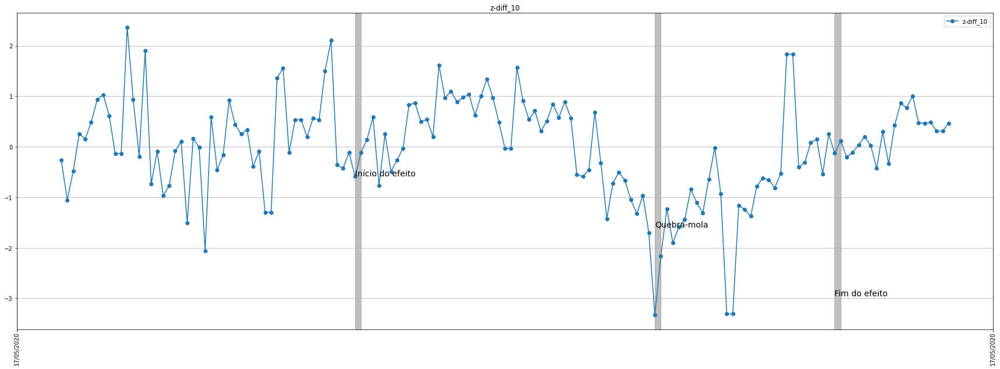


Quebra-mola às 17/05/2020 20:25:30.300000
Shape: (149, 36)


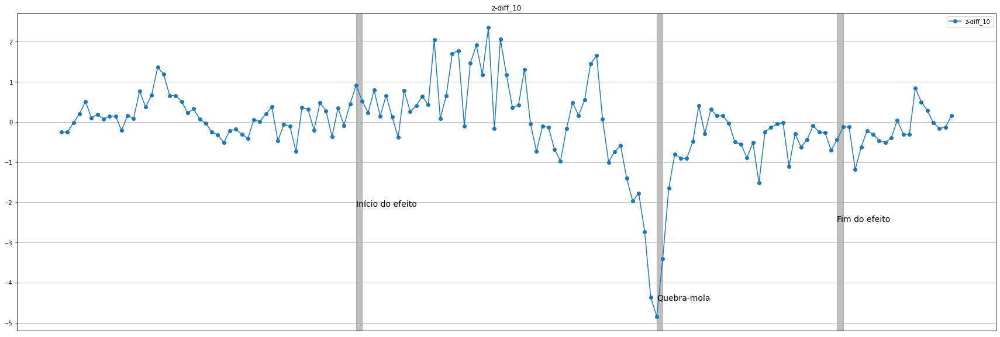


Quebra-mola às 17/05/2020 20:27:02.900000
Shape: (149, 36)


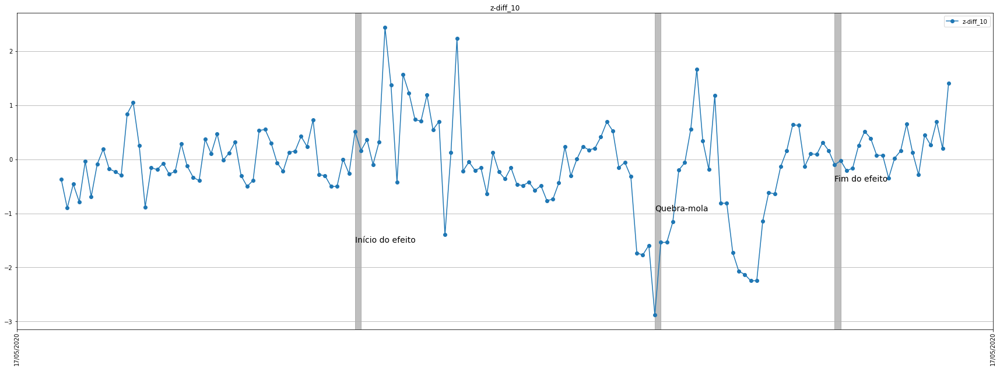


Quebra-mola às 17/05/2020 20:27:34.100000
Shape: (149, 36)


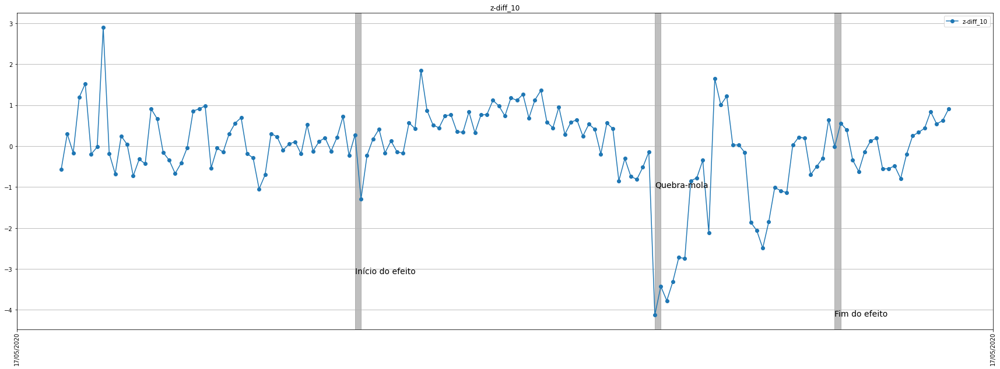


Quebra-mola às 17/05/2020 20:28:05.500000
Shape: (149, 36)


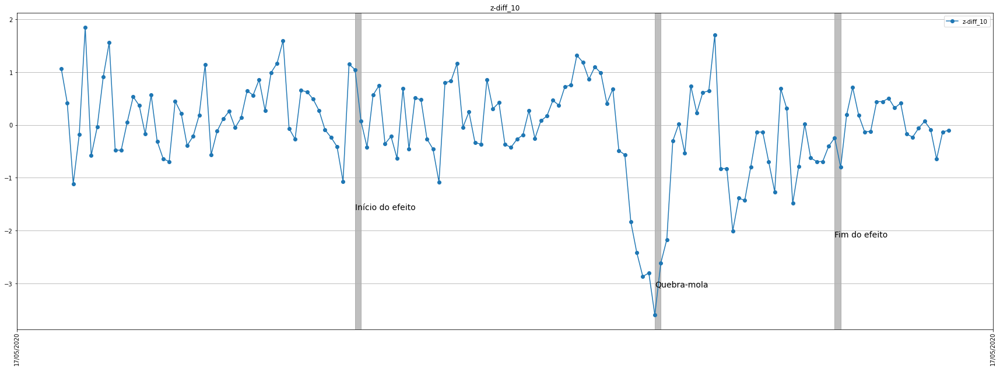


Quebra-mola às 17/05/2020 20:28:15.300000
Shape: (149, 36)


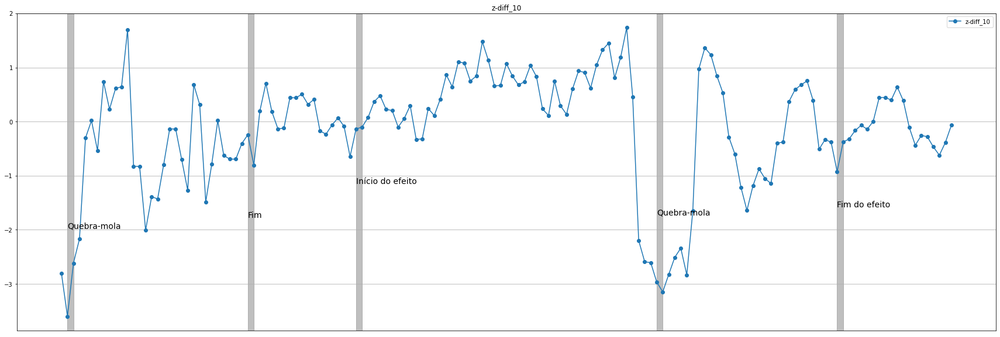

In [17]:
plot_speed_bump_distribution(df, mapping_speed_bump_timestamps, speed_bump_id=1, columns=['z-diff_10'], backward_time=10, forward_time=5, limit=20, save_figure=False)

# Distribuição das features entre as regiões

In [12]:
dist_columns = ['y','z','z-norm', 'z-diff_5', 'z-diff_10', 'z-diff_20', 'z-diff_30', 'z-diff_40', 'z-diff_50', 'z-mean_5', 'z-mean_10', 'z-mean_20', 'z-mean_30', 'z-mean_40', 'z-mean_50', 'z-norm', 'z-std_5', 'z-std_10', 'z-std_20', 'z-std_30', 'z-std_40', 'z-std_50', 'cp', 'cp-norm']

./out/0_dist_export_lunar_20200517_20200620.png


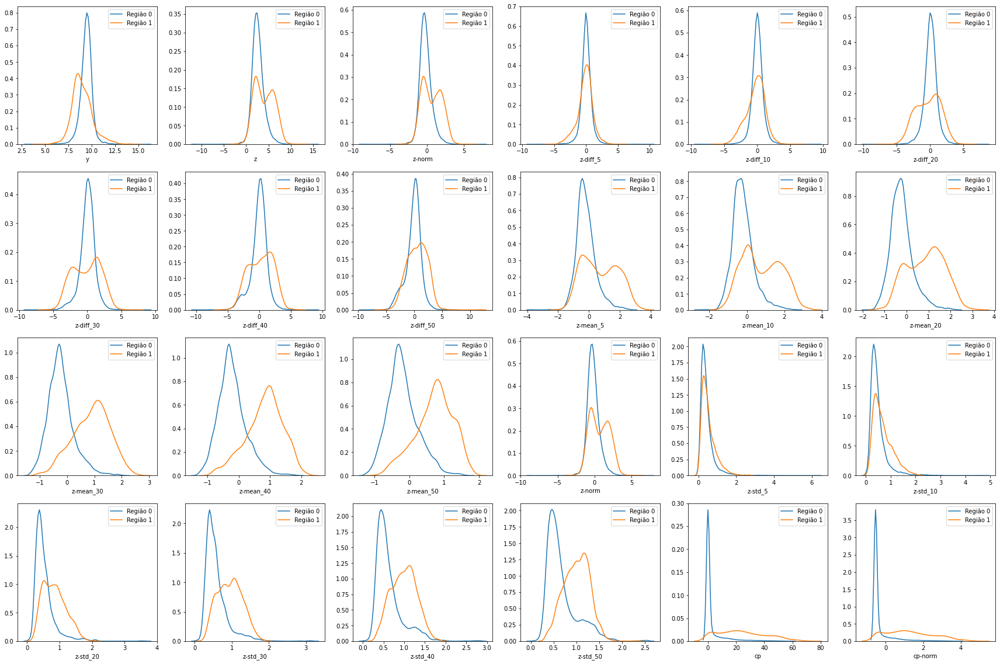

In [13]:
distplot2(df, dist_columns, ncols=6, nrows=4, size=(30,20), save_figure=output_config['save_figures'])

In [14]:
#scatter_hist(df[df.region_id == input_config['regions'][1]]['cp'], df[df.region_id == input_config['regions'][1]]['z'])

# Matriz de correlação na Região 0

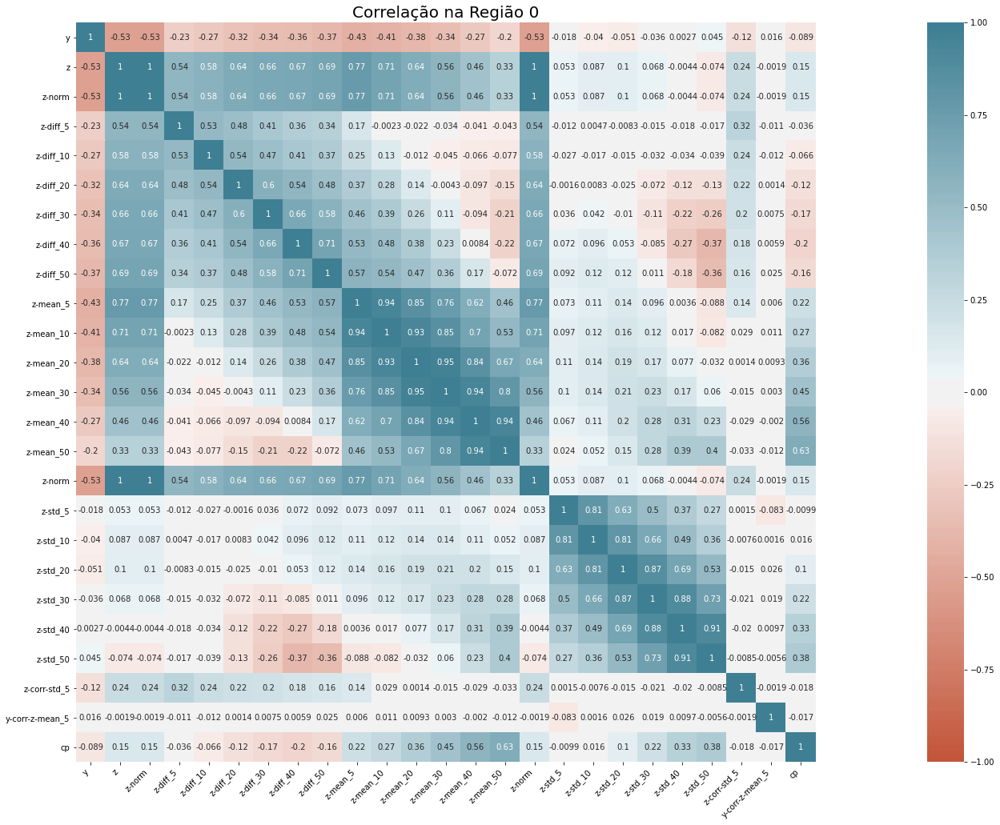

In [15]:
corr_matrix_plot(df, region_id=input_config['regions'][0], title='Correlação na Região 0', font_size=20, save_figure=output_config['save_figures'])

# Matriz de correlação na Região 1

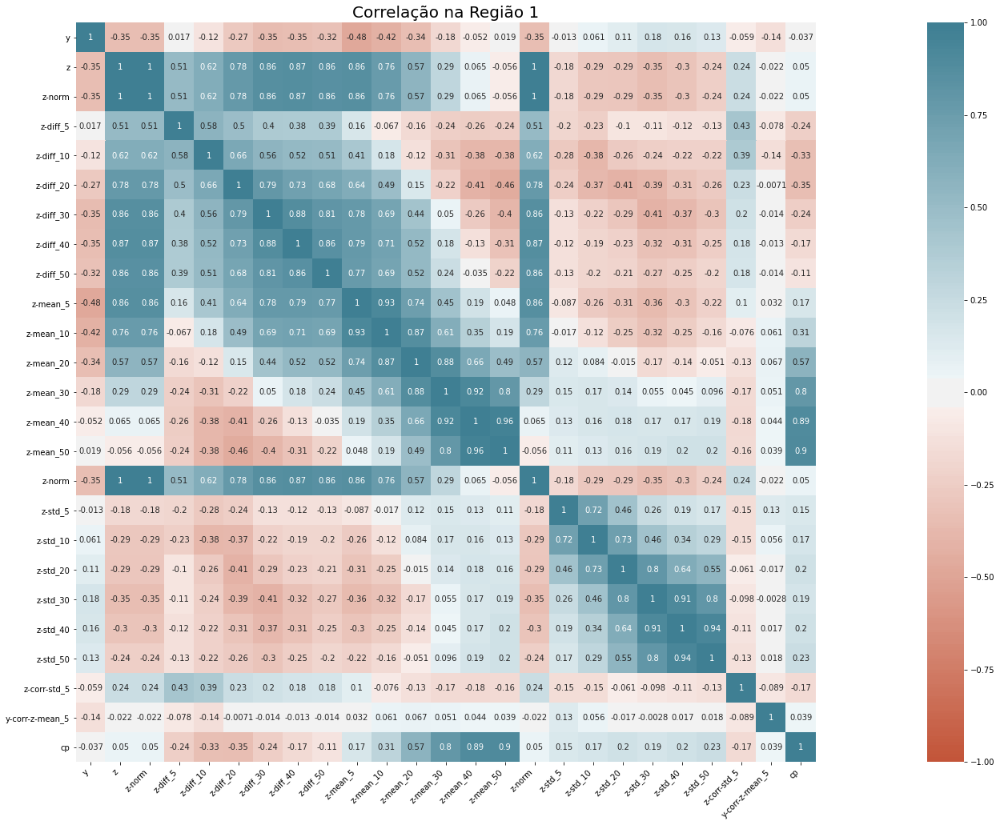

In [16]:
corr_matrix_plot(df, region_id=input_config['regions'][1], title='Correlação na Região 1', font_size=20, save_figure=output_config['save_figures'])

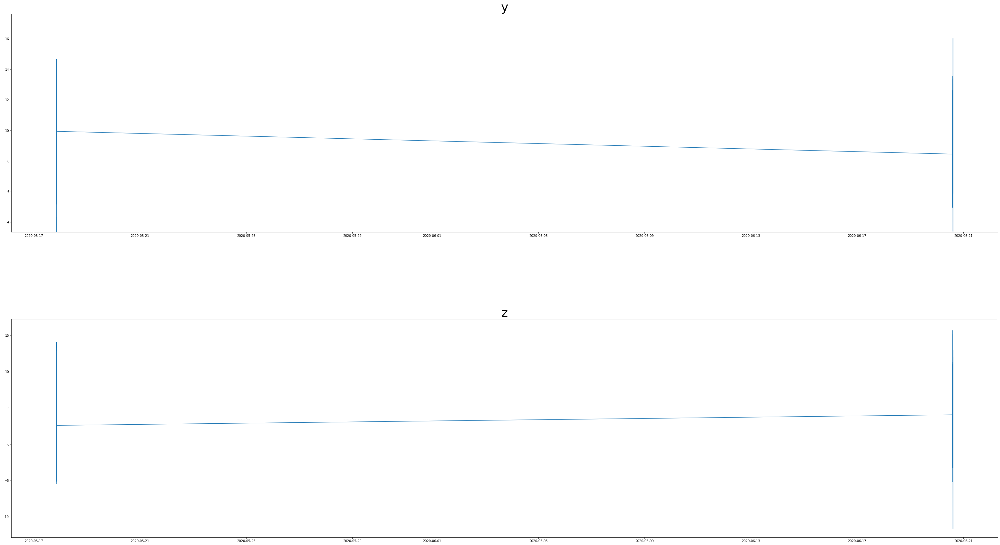

In [17]:
#_df = df.loc[df.index > '2020-06-06 07:43:00']

fig, axs = plt.subplots(2, 1, sharex=False,figsize=(55,30))
fig.subplots_adjust(hspace=0.4, wspace=0.1)

used_cols = ['y', 'z']

# Plot each graph, and manually set the y tick values
for i in range(2):
    plt_legend, = axs[i].plot(df[used_cols[i]], label=f'{used_cols[i]}')           
    axs[i].set_ylim(ymin = df[used_cols[i]].min()*1.1,ymax=df[used_cols[i]].max()*1.1, auto=False)
    axs[i].set_title(used_cols[i], fontSize=38)


plt.show()

In [18]:
# from scipy import linalg
# from sklearn.covariance import EmpiricalCovariance, MinCovDet


# df_mahala = df[['y','z', 'region_id']]

# timestamps = list(df_mahala.index.values)
# tam = len(timestamps)

# df_mahala.loc[timestamps[int(tam/2)]]

# 1 = df_mahala.loc[df_mahala.index <= '2020-05-17 20:22:59']
# # df_mahala_2 = df_mahala.loc[df_mahala.index > '2020-05-17 20:22:59']

# df_mahala_1 = df_mahala[df_mahala.region_id==0]
# df_mahala_2 = df_mahala[df_mahala.region_id==1]


# robust_cov = MinCovDet().fit(df_mahala_1)
# cov = robust_cov.covariance_
# cov_inverse = linalg.inv(cov)

# mean = df_mahala_1.mean()

# x_minus_mean = df_mahala_2.values - mean.values

# x_minus_mean = pd.DataFrame(x_minus_mean,index=df_mahala_2.index, columns =df_mahala_2.columns)

# X=x_minus_mean
# Y=cov_inverse
# mx = np.matrix(X)
# my = np.matrix(Y)

# C=mx*my
# D = np.multiply(C,mx)

# df_result =pd.DataFrame(D,columns = df_mahala_2.columns, index=df_mahala_2.index)

# df_result["Mahalanobis Manual"] = df_result.sum(axis=1)
# df_result["Mahalanobis Manual [ABS]"] = df_result.abs().sum(axis=1)

# df_result['region_id'] = 1

# fig, axs = plt.subplots(2, 1, sharex=False,figsize=(55,30))
# fig.subplots_adjust(hspace=0.4, wspace=0.1)

# used_cols = df_result.columns

# # Plot each graph, and manually set the y tick values
# for i in range(2):
#     plt_legend, = axs[i].plot(df_result[used_cols[i]], label=f'{used_cols[i]}')           
#     axs[i].set_ylim(ymin = df_result[used_cols[i]].min()*1.1,ymax=df_result[used_cols[i]].max()*1.1, auto=False)
#     axs[i].set_title(used_cols[i], fontSize=38)


# plt.show()


In [19]:
# _df = df[df.region_id == input_config['regions'][1]]


# # creating traces
# trace1 = go.Scatter(x= _df['y'],
#                     y= _df['z'],
#                     mode= "markers",
#                     name= "Mean")
# trace2 = go.Scatter(x= _df['y'],
#                     y= _df['z-mean_10'],
#                     mode= "markers",
#                     name= "Std")
# # trace3 = go.Scatter(x= _df['z-diff_10'],
# #                     y= _df['z'],
# #                     mode= "markers",
# #                     name= "Diff")

# layout = go.Layout(
#          title= "Correlação entre dados do dataframe",
#          xaxis=dict(title= "CORR"),
#          yaxis=dict(title= "Axis Z")
#          )
# data = [trace1,trace2] #, trace3]
# fig = go.Figure(data=data, layout=layout)
# fig.show()

In [20]:
#df3 = tukey_method(df, ignore_on_timestamps=all_timestamps, columns=['z'], q1=0.35, q3=0.65)

In [21]:
def tukey_method(df0, ignore_on_timestamps, columns, q1=0.25, q3=0.75, drop = True):
    ''' 
    Função que remove outliers de acordo com o método de Tukey
    -----------------------------------------------------------------------------
    Calculam-se os quantils Q1 e Q3, e o intervalo interquartil IQR=Q3-Q1
    São considerados como outliers todos os valores fora do intervalo [Q1-1.5*IQR ; Q3+1.5*IQR]
    -----------------------------------------------------------------------------
    Parâmetros :        
    
        df0::pandas.DataFrame
            DataFrame com o conjunto de dados a ser filtrado
        columns::list
            Lista com o nome de todas as colunas nas quais se deseja aplicar o método
        q1::float
            Valor do primeiro quantil usado no método. Default é Q1 = 25%
        q3::float
            Valor do terceiro quantil usado no método. Default é Q3 = 75%
        Drop::Bool
            Bool que indica se a função remove os outliers, ou substitue estes por Nan. Default = True
    
    Retorno :
        Um novo DataFrame sem os outliers
    -----------------------------------------------------------------------------  
    Exemplo : 
        df = tukey_method(df0, ['TAG1','TAG2','TAG3'])
            
    '''
    df=df0.copy()
    
    df.drop(ignore_on_timestamps, axis=0,errors='ignore', inplace=True)
    df.reset_index(inplace=True)

    size1 = df.shape[0]    
    for col in columns:
        Q1 = df[col].quantile(q1)                 
        Q3 = df[col].quantile(q3)
        iqr = 1.5*(Q3-Q1)
        if drop:
            df = df[(df[col] < Q3+iqr) & (df[col]>Q1-iqr)]
        else:
            df.loc[(df[col] > Q3+iqr),col]=np.nan
            df.loc[(df[col] < Q1-iqr),col]=np.nan
    if drop:
        size2 = df.shape[0]
        print('Removing outliers by tukey method:')
        print (f'Size reduction: {size1:,} → {size2:,} | {size2/size1*100:.2f}% of original size'.replace(',',' '))
    return df
